In [1]:
import numpy as np
import cupy as cp
import astropy.units as u
from astropy.io import fits
from matplotlib.patches import Rectangle, Circle
from pathlib import Path
from IPython.display import clear_output
from importlib import reload

import poppy

import logging, sys
poppy_log = logging.getLogger('poppy')
poppy_log.setLevel('DEBUG')
logging.basicConfig(stream=sys.stdout, level=logging.INFO)
poppy_log.disabled = False

import warnings
warnings.filterwarnings("ignore")

from prop_models import full, agpm
import misc_funs as misc
reload(full)

wavelength_c = 750e-9*u.m

reload(agpm)
vortex = agpm.IdealAGPM(name='VVC', wavelength=wavelength_c, charge=6)
lyot_stop = poppy.CircularAperture(name='Lyot Stop', radius=3.65*u.mm/2, gray_pixel=False)


DEBUG:poppy:Skipping oversampling, oversample < 1 or already padded 


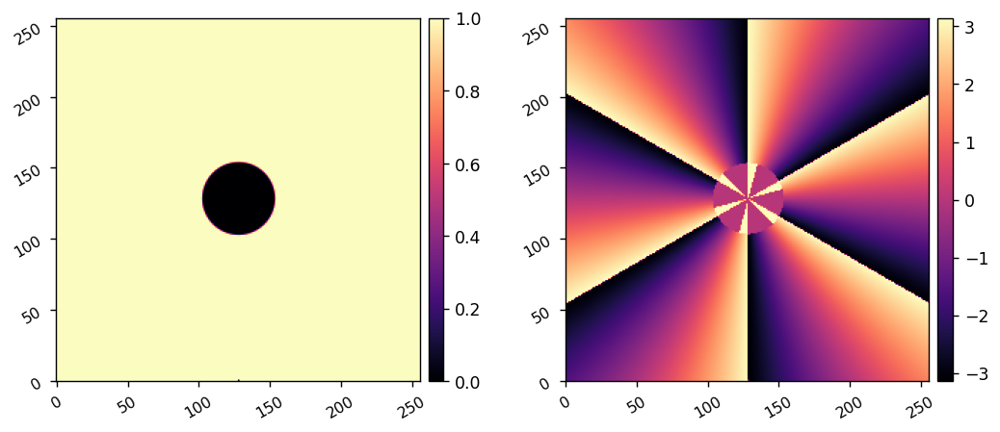

In [2]:
reload(agpm)
vortex = agpm.IdealAGPM(name='VVC', wavelength=wavelength_c, charge=6, singularity=20*u.um)
wave = poppy.FresnelWavefront(wavelength=wavelength_c, beam_radius=50*u.um, npix=256, oversample=1)
vvc_phasor = vortex.get_phasor(wave)
misc.imshow2(np.abs(vvc_phasor), np.angle(vvc_phasor))

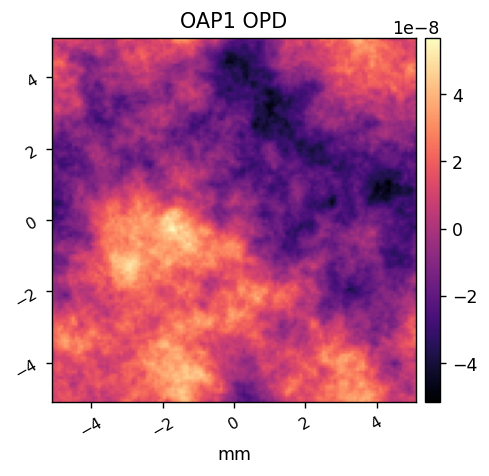

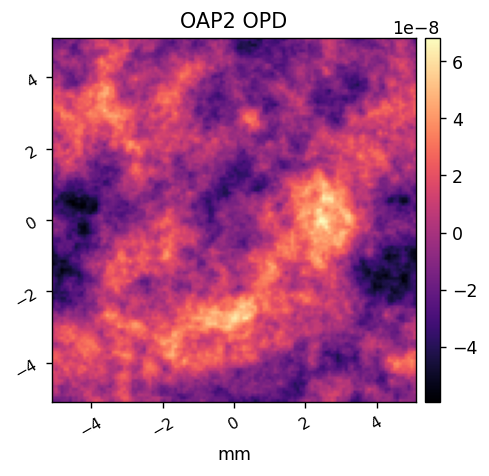

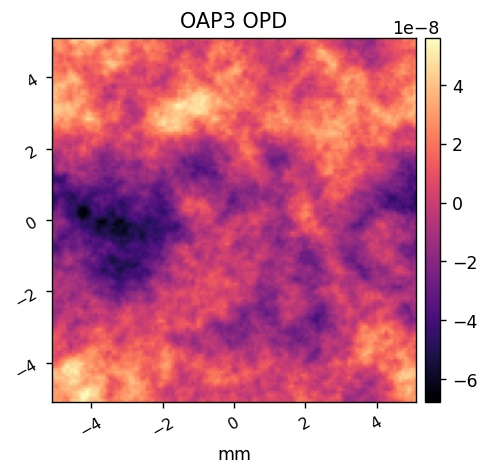

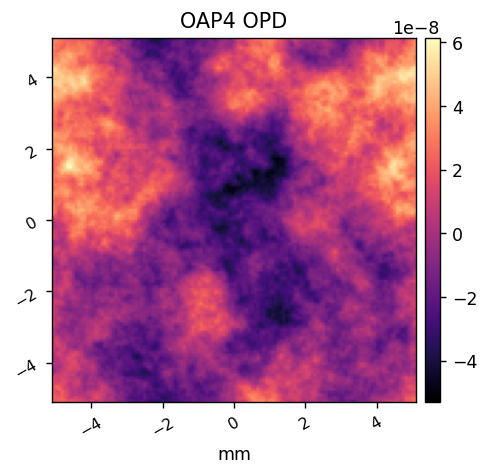

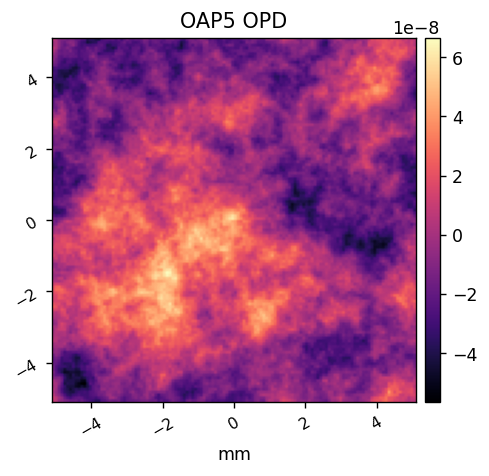

In [54]:
reload(full)
c = full.CORO()
c.show_opds()

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


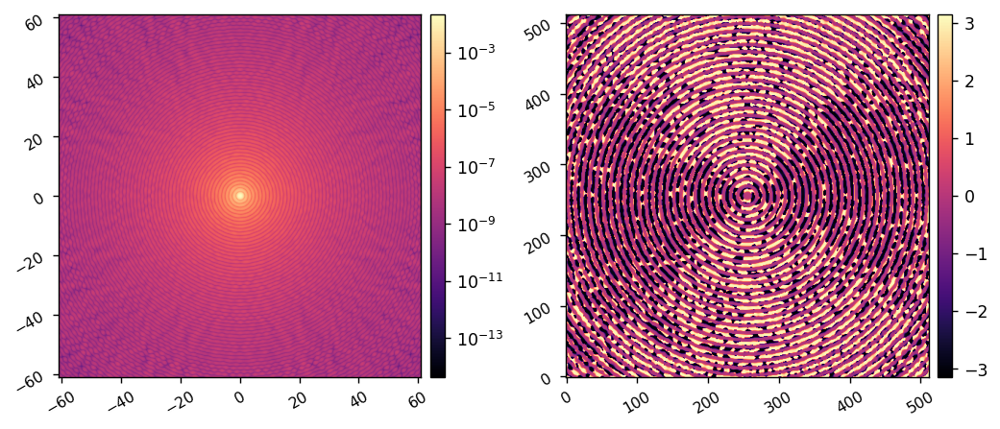

In [56]:
reload(full)
reload(misc)
poppy_log.disabled = True

vortex = agpm.IdealAGPM(name='VVC', wavelength=wavelength_c, charge=6, singularity=20*u.um)
lyot_stop = poppy.CircularAperture(name='Lyot Stop', radius=3*u.mm, gray_pixel=False)

c = full.CORO(npix=256, oversample=16, npsf=512,
              use_opds=True,
#               FPM=vortex,
              LYOT=lyot_stop,
             )

psf = c.calc_psf()
misc.imshow2(np.abs(psf)**2, np.angle(psf),
             pxscl1=c.psf_pixelscale_lamD, lognorm1=True)



In [58]:
c.inwave.amplitude

array([[2.11704501e-05, 1.99055236e-05, 1.93295308e-05, ...,
        1.87645172e-05, 1.97837546e-05, 2.01435037e-05],
       [1.99919885e-05, 1.88095174e-05, 1.82724664e-05, ...,
        1.76659020e-05, 1.86484535e-05, 1.90063395e-05],
       [1.94837726e-05, 1.83417852e-05, 1.78215072e-05, ...,
        1.71557784e-05, 1.81372449e-05, 1.85067677e-05],
       ...,
       [1.84634431e-05, 1.73199178e-05, 1.67747100e-05, ...,
        1.64474155e-05, 1.73150580e-05, 1.76024989e-05],
       [1.95922064e-05, 1.83949645e-05, 1.78365566e-05, ...,
        1.74343679e-05, 1.83570048e-05, 1.86674740e-05],
       [2.00482419e-05, 1.88371802e-05, 1.82808205e-05, ...,
        1.78122322e-05, 1.87633495e-05, 1.90899967e-05]])

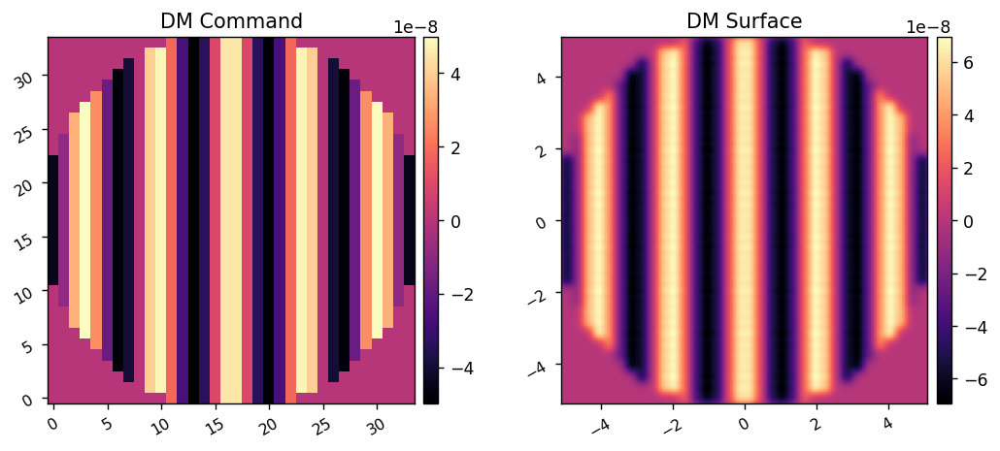

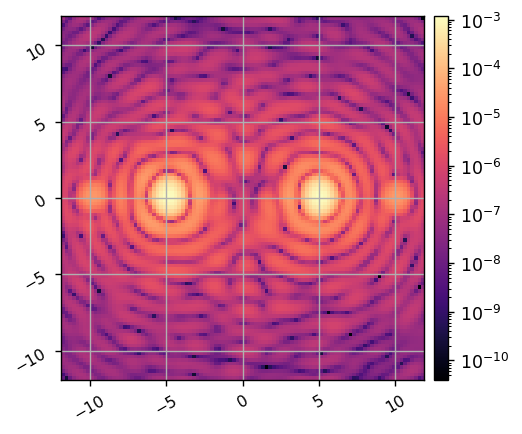

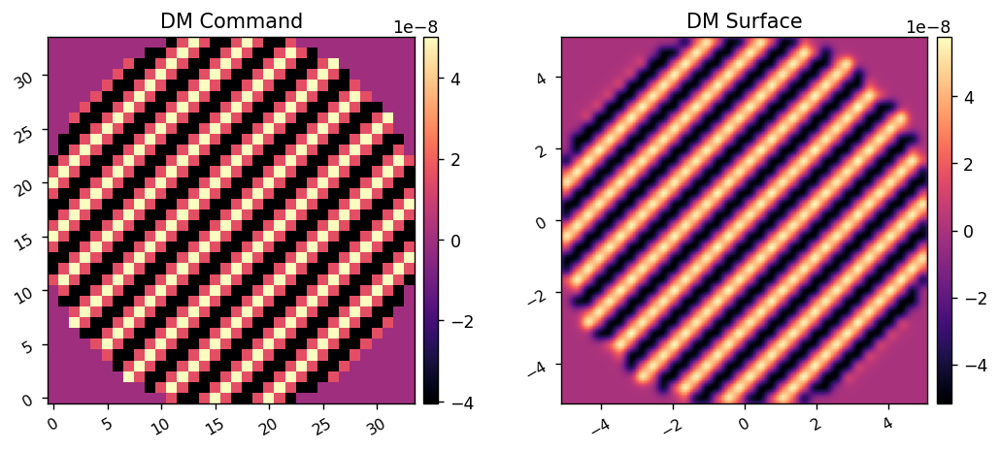

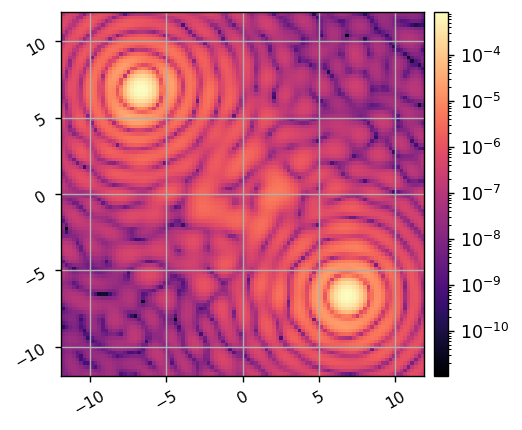

In [9]:
reload(full)
Nact = c.Nact

xpp = np.linspace(-c.Nact/2, c.Nact/2-1, c.Nact) + 1/2
ppx, ppy = np.meshgrid(xpp,xpp)

separation = 5

amp = 5e-8
com_1 = amp*np.cos(2*np.pi*ppx*separation/Nact)*c.dm_mask
com_2 = amp*np.cos(2*np.pi*(ppx - ppy)/separation)*c.dm_mask

c.set_dm(com_1)
c.show_dm()
im1 = c.snap()
misc.imshow1(im1, pxscl=c.psf_pixelscale_lamD, lognorm=True, grid=True)

c.set_dm(com_2)
c.show_dm()
im2 = c.snap()
misc.imshow1(im2, pxscl=c.psf_pixelscale_lamD, lognorm=True, grid=True)

In [32]:
data = np.array([np.abs(pupil_wf)/5, np.angle(pupil_wf)])
misc.save_fits('pupil-data/retrieved_wfe.fits', data, header={'PIXELSCL':10.2/206})

Saved data to:  pupil-data/retrieved_wfe.fits


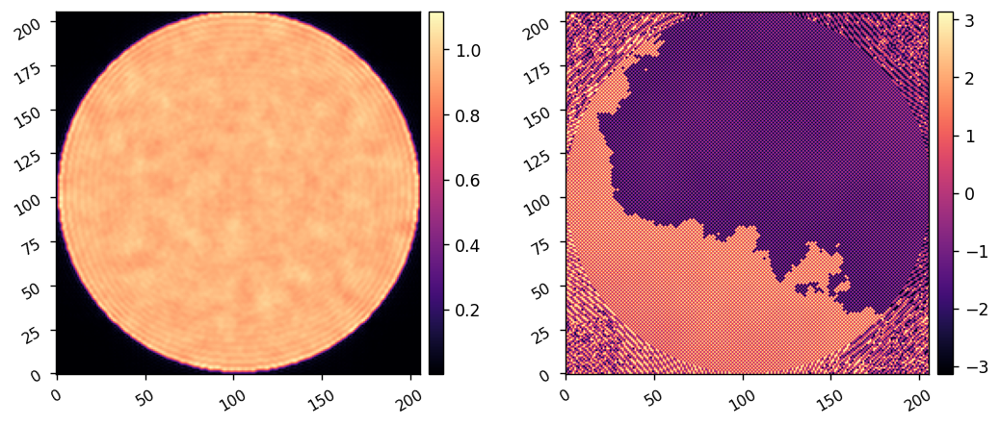

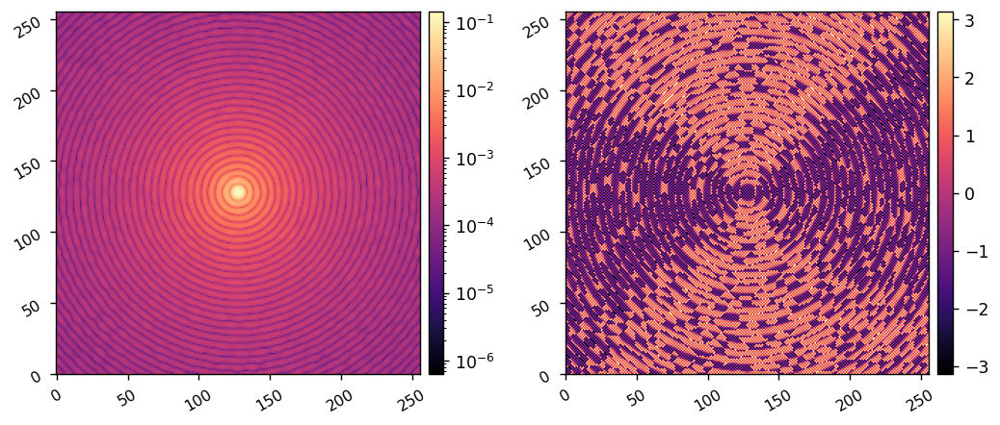

In [33]:
psf = misc.pad_or_crop(psf, 1024)
pupil_wf = np.fft.fftshift(np.fft.fft2(psf))
misc.imshow2(np.abs(pupil_wf)/5, np.angle(pupil_wf), npix=206)

psf_new = np.fft.ifft2(pupil_wf)
misc.imshow2(np.abs(psf_new), np.angle(psf_new), npix=256, lognorm1=True)

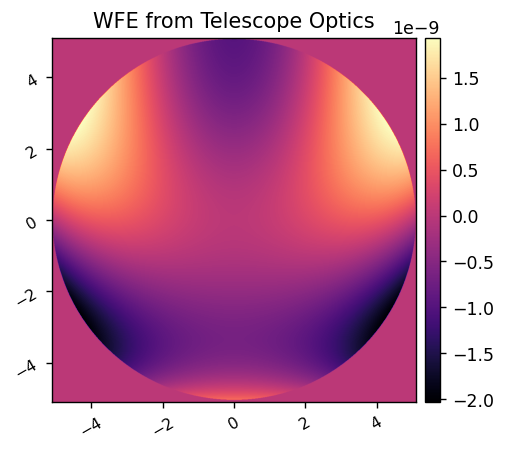

In [5]:
hdr = fits.getheader('wfe_on_axis.fits')
wfe = poppy.FITSOpticalElement(opd='wfe_on_axis.fits', opdunits='meters',
                               pixelscale=c.pupil_diam.to_value(u.m)/hdr['NAXIS1'])
misc.imshow1(wfe.opd, 'WFE from Telescope Optics', pxscl=wfe.pixelscale.to(u.mm/u.pix))

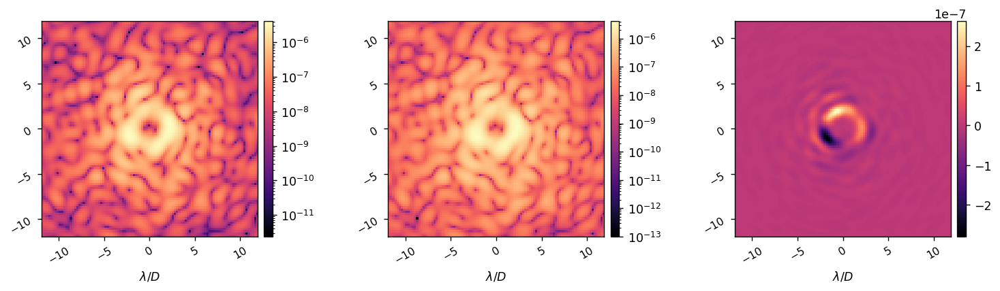

In [8]:
reload(full)
reload(misc)
poppy_log.disabled = True

vortex = agpm.IdealAGPM(name='VVC', wavelength=wavelength_c, charge=6, singularity=20*u.um)
lyot_stop = poppy.CircularAperture(name='Lyot Stop', radius=3*u.mm, gray_pixel=False)

c = full.CORO(npix=128, oversample=16, npsf=100,
              use_opds=True,
              FPM=vortex,
              LYOT=lyot_stop,
             )

c.OTEWFE = None
im1 = c.snap()

c.OTEWFE = wfe
im2 = c.snap()

diff = im1-im2

misc.imshow3(im1, im2, diff,
             pxscl=c.psf_pixelscale_lamD, xlabel='$\lambda/D$',
             lognorm1=True, lognorm2=True,
             wspace=0.5)



Propagating wavelength 750.000 nm.
PSF calculated in 0.706s


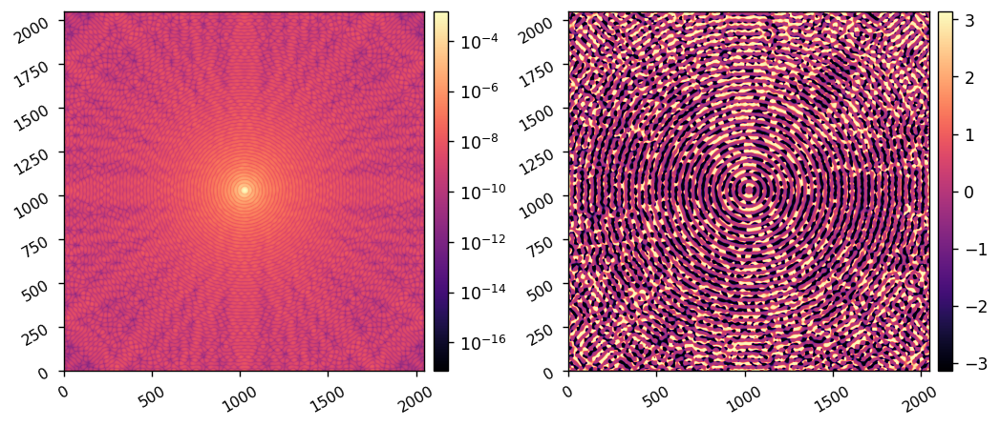

In [20]:
reload(full)
poppy_log.disabled = True

vortex = agpm.IdealAGPM(name='VVC', wavelength=wavelength_c, charge=6, singularity=20*u.um)
lyot_stop = poppy.CircularAperture(name='Lyot Stop', radius=3*u.mm, gray_pixel=False)

c = full.CORO(dm_inf='inf.fits',
              npix=128,
              oversample=16,
              use_opds=True,
             )

c.OTEWFE = wfe
c.APODIZER = None
# c.FPM = vortex
c.LYOT = lyot_stop
wfs = c.calc_wfs()

misc.imshow2(wfs[-1].intensity, wfs[-1].phase, lognorm1=True)

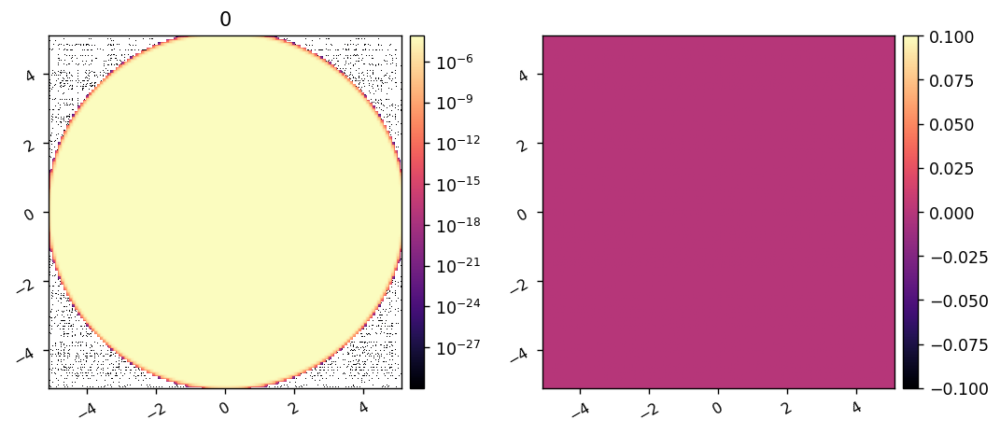

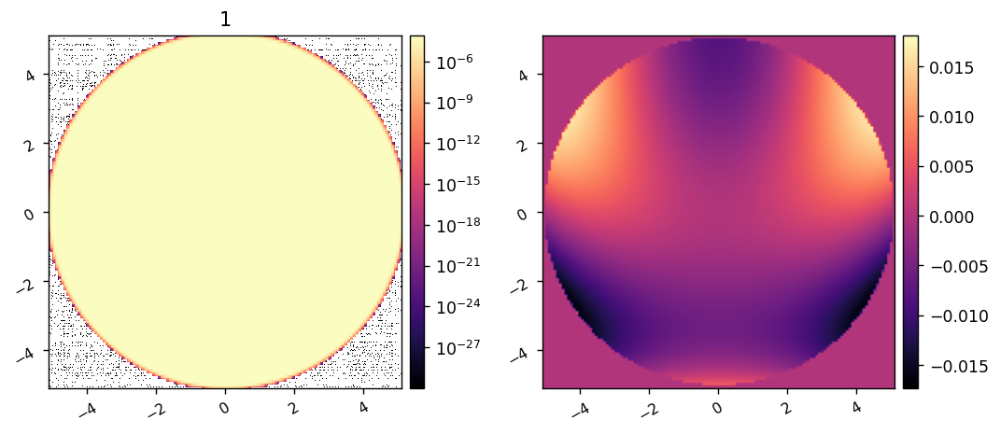

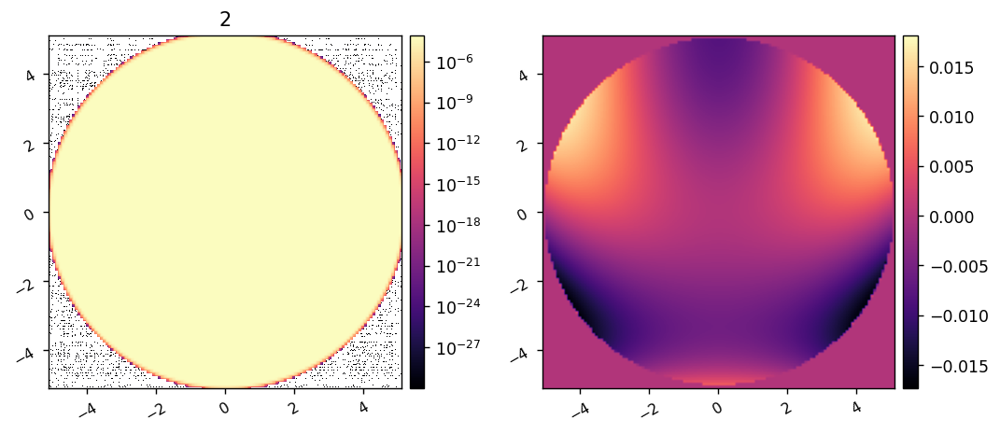

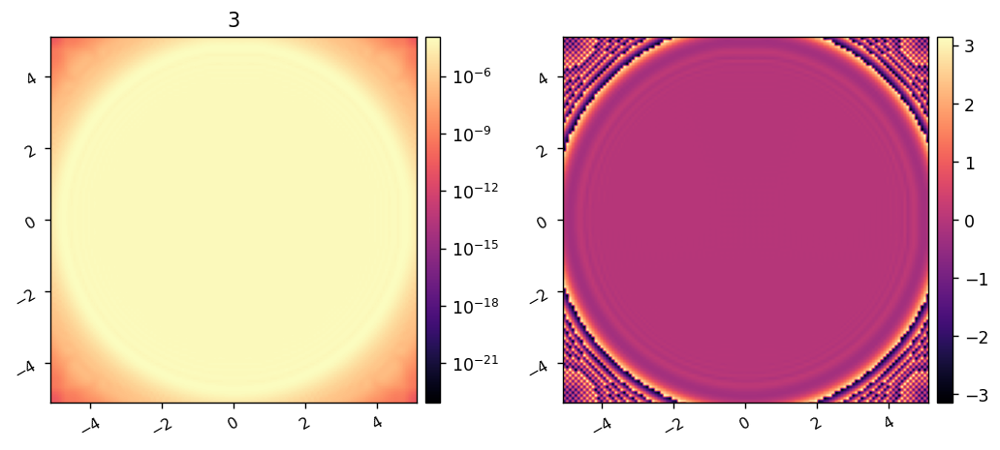

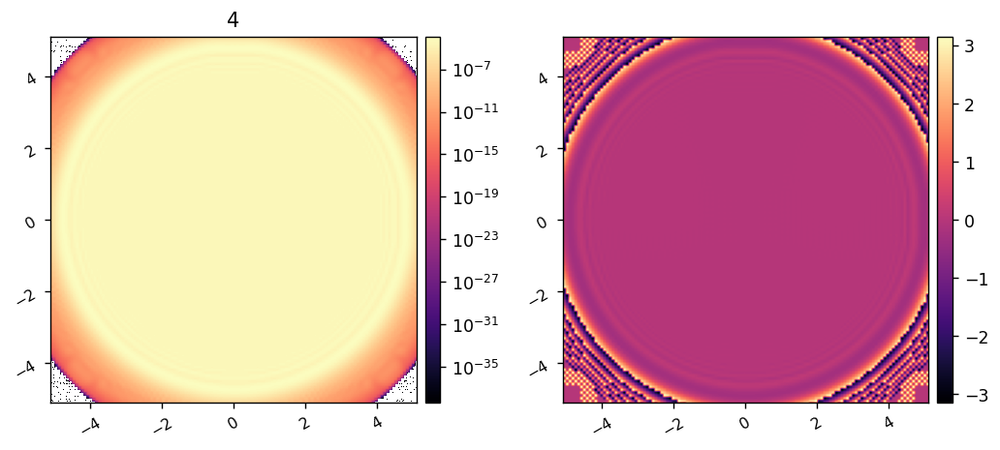

...

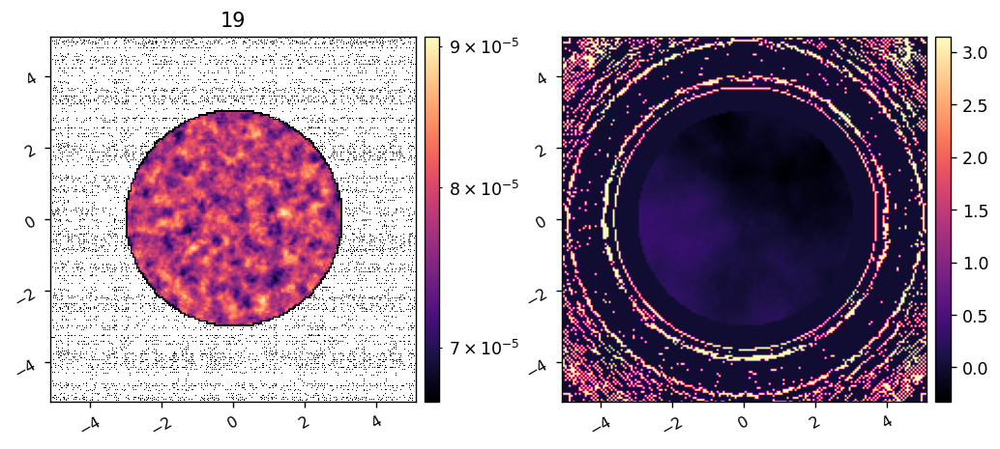

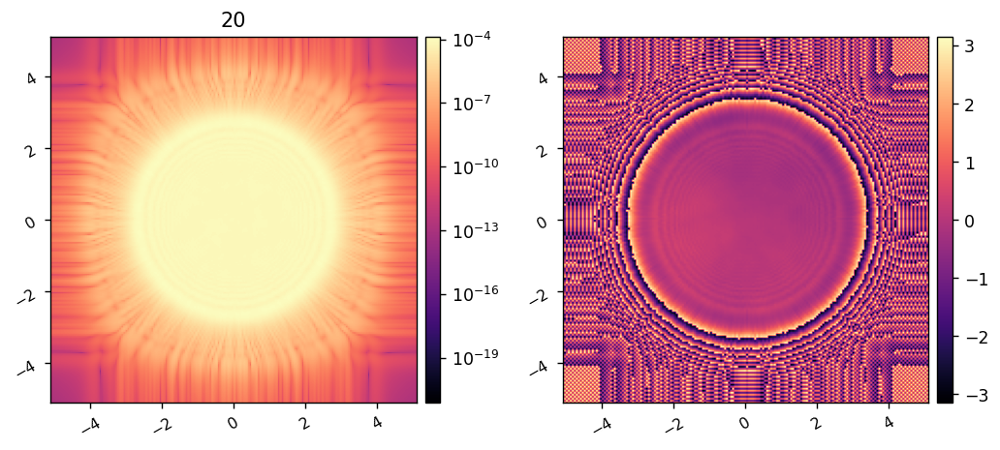

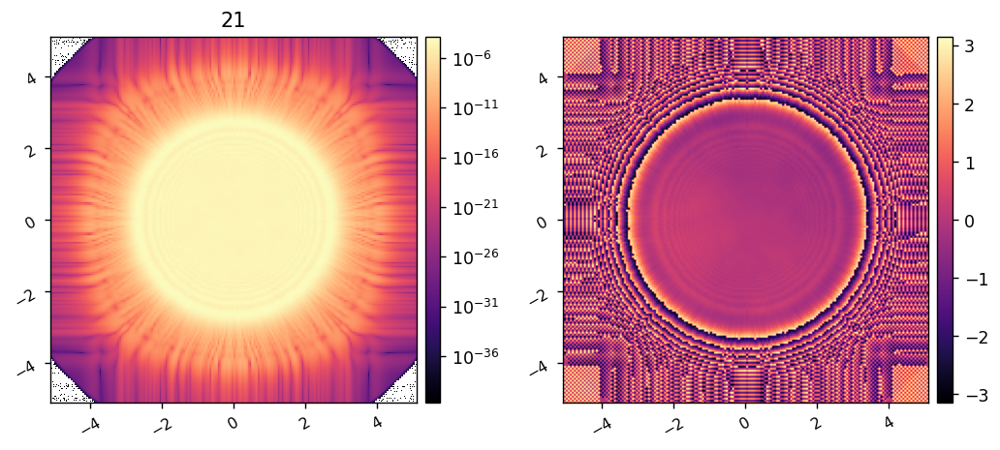

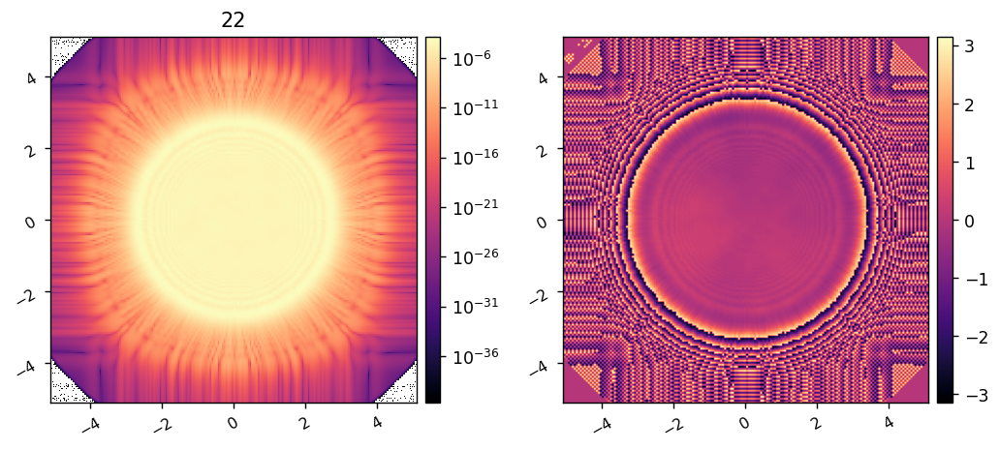

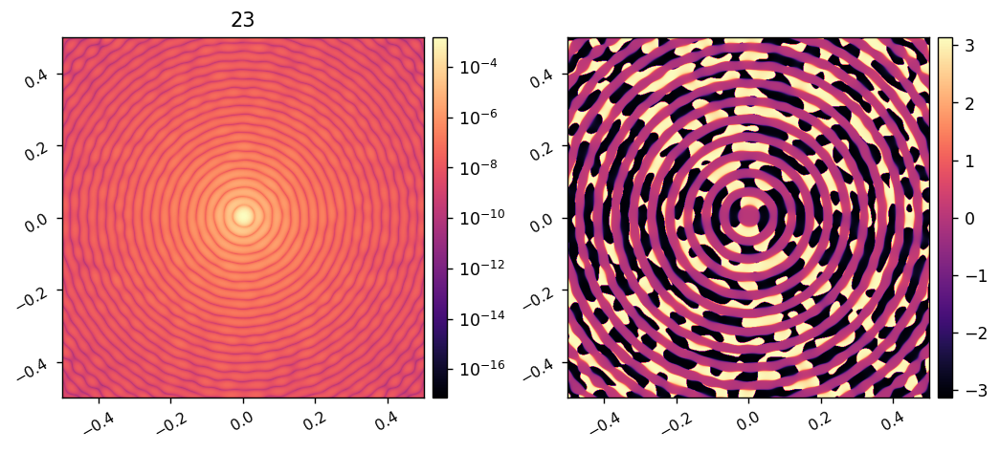

In [21]:
from IPython.display import display

pupil_lim = c.pupil_diam.value/2
fp_lim = 1/2

for i,wf in enumerate(wfs):
    if i-1 in [c.inter_fp_index, c.fpm_index, c.image_index]:
        axlims= [-fp_lim, fp_lim, -fp_lim, fp_lim]
    else:
        axlims= [-pupil_lim, pupil_lim, -pupil_lim, pupil_lim]
    misc.imshow2(wf.intensity, wf.phase, '{:d}'.format(i), 
                 pxscl1=wf.pixelscale.to(u.mm/u.pix), pxscl2=wf.pixelscale.to(u.mm/u.pix),
                 axlims=axlims,
                 lognorm1=True,)

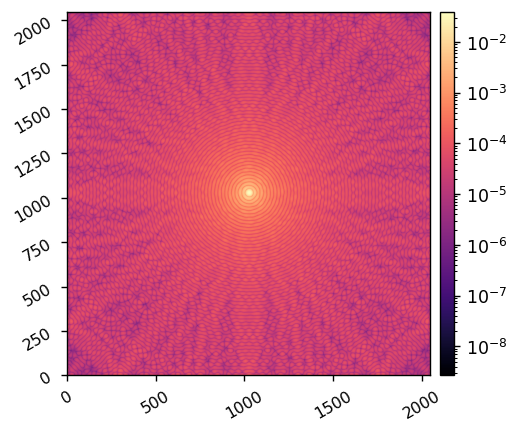

In [53]:
misc.imshow1(c.inwave.amplitude, lognorm=True)

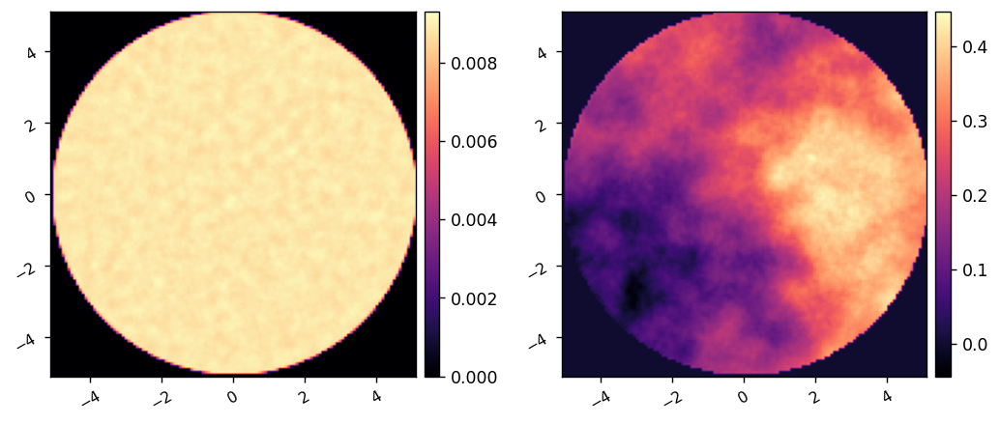

Saved data to:  pupil-data/pre_fpm_pupil_wfe.fits


In [50]:
pre_fpm_pupil = wfs[10]

x,y = pre_fpm_pupil.coordinates()
r = np.sqrt(x**2 + y**2)
pre_fpm_mask = r<0.0051
misc.imshow2(pre_fpm_pupil.amplitude*pre_fpm_mask, pre_fpm_pupil.phase*pre_fpm_mask,
#              axlims=[-5.1, 5.1, -5.1, 5.1], 
             npix=128,
             pxscl=pre_fpm_pupil.pixelscale.to(u.mm/u.pix))
misc.save_fits('pupil-data/pre_fpm_pupil_wfe.fits', 
               data=np.array([misc.pad_or_crop(pre_fpm_pupil.amplitude.get(), c.npix), 
                              misc.pad_or_crop(pre_fpm_pupil.phase.get(), c.npix)]),
               header={'PIXELSCL':pre_fpm_pupil.pixelscale.value})

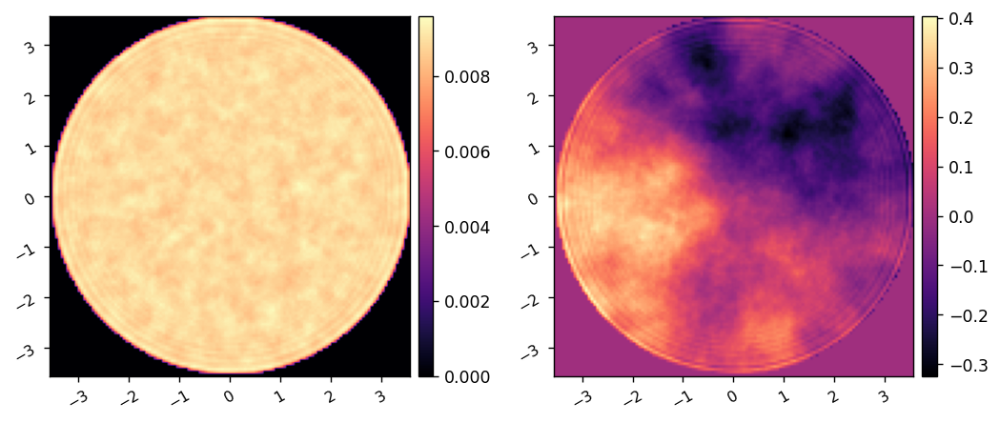

Saved data to:  pupil-data/post_fpm_pupil_wfe.fits


In [48]:
post_fpm_pupil = wfs[18]
x,y = post_fpm_pupil.coordinates()
r = np.sqrt(x**2 + y**2)
post_fpm_mask = r<(0.0051*350/500)
misc.imshow2(post_fpm_pupil.amplitude*post_fpm_mask, post_fpm_pupil.phase*post_fpm_mask,
#              axlims=[-5.1, 5.1, -5.1, 5.1], 
             npix=128,
             pxscl=post_fpm_pupil.pixelscale.to(u.mm/u.pix))
misc.save_fits('pupil-data/post_fpm_pupil_wfe.fits', 
               data=np.array([misc.pad_or_crop(post_fpm_pupil.amplitude.get(), c.npix), 
                              misc.pad_or_crop(post_fpm_pupil.phase.get(), c.npix)]),
               header={'PIXELSCL':post_fpm_pupil.pixelscale.value*500/350})